In [1]:
import os
os.chdir("../../../")

In [2]:
import numpy as np
import pandas as pd
import scanpy as sc
import surgeon

Using TensorFlow backend.
/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:523: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:524: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:525: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/mohammad/anaconda3/e

In [3]:
sc.set_figure_params(dpi=200)

In [4]:
condition_key = "study"
cell_type_key = "cell_type"
target_datasets = ["PBMC 68K"]

In [5]:
adata = sc.read(f"./data/pbmc_atac/pbmc_atac_normalized.h5ad")
adata

AnnData object with n_obs × n_vars = 68054 × 4467 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [6]:
hvg = surgeon.utils.hvg_batch(adata, target_genes=3000, batch_key=condition_key)

Using 958 HVGs from full intersect set
Using 1364 HVGs from n_batch-1 set
Using 678 HVGs from n_batch-2 set
Using 3000 HVGs


In [7]:
adata = adata[:, hvg]
adata

View of AnnData object with n_obs × n_vars = 68054 × 3000 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [410]:
sc.pp.neighbors(adata)
sc.tl.umap(adata)

         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/umap/spectral.py:229: UserWarning: Embedding a total of 4 separate connected components using meta-embedding (experimental)
  n_components


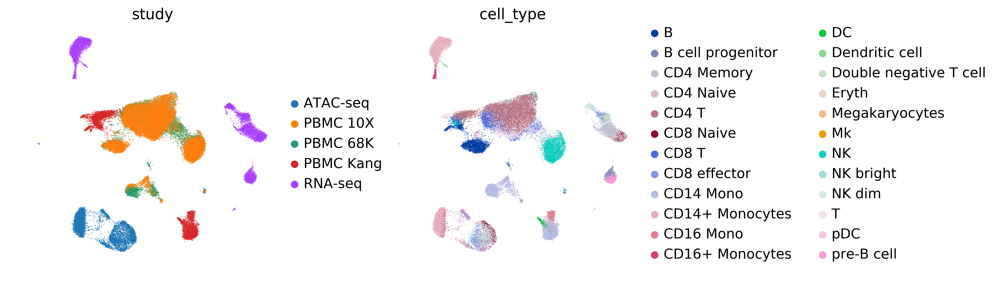

In [411]:
sc.pl.umap(adata, color=[condition_key, cell_type_key], wspace=0.3, frameon=False)

In [8]:
adata.obs[condition_key].value_counts()

PBMC 10X     26202
PBMC 68K     18006
RNA-seq       9432
ATAC-seq      7866
PBMC Kang     6548
Name: study, dtype: int64

In [9]:
adata_for_training = adata[~adata.obs[condition_key].isin(target_datasets)]
adata_out_of_sample = adata[adata.obs[condition_key].isin(target_datasets)]

In [10]:
adata_for_training.obs[condition_key].value_counts()

PBMC 10X     26202
RNA-seq       9432
ATAC-seq      7866
PBMC Kang     6548
Name: study, dtype: int64

In [ ]:
sc.pl.umap(adata_out_of_sample, color=[condition_key, cell_type_key], wspace=0.3, frameon=False)

In [11]:
adata_out_of_sample.obs[condition_key].value_counts()

PBMC 68K    18006
Name: study, dtype: int64

In [12]:
n_datasets = len(adata_for_training.obs[condition_key].unique().tolist())
n_datasets

4

In [13]:
network = surgeon.archs.CVAE(x_dimension=adata_for_training.shape[1], 
                             z_dimension=10,
                             architecture=[128,128, 64, 64, 10],
                             use_batchnorm=True,
                             n_conditions=n_datasets,
                             lr=0.001,
                             alpha=1,
                             beta=5,
                             eta=10,
                             clip_value=1000.0,
                             loss_fn='mse',
                             model_path="./models/CVAE/run/pbmc_atac/before/",
                             dropout_rate=0.0005,
                             output_activation='relu')

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 3000)         0                                            
__________________________________________________________________________________________________
encoder_labels (InputLayer)     (None, 4)            0                                            
__________________________________________________________________________________________________
first_layer (FirstLayer)        (None, 128)          384512      data[0][0]                       
                                                                 encoder_labels[0][0]             
__________________________________________________________________________________________________
batch_normalization_1 (BatchNor (None, 128)          512         first_layer[0][0]                
__________

In [14]:
datasets = adata_for_training.obs[condition_key].unique().tolist()
dataset_encoder = surgeon.utils.create_dictionary(datasets, [])

In [15]:
datasets

['PBMC Kang', 'PBMC 10X', 'RNA-seq', 'ATAC-seq']

In [16]:
adata_for_training

View of AnnData object with n_obs × n_vars = 50048 × 3000 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [17]:
sc.pp.subsample(adata_for_training, fraction=0.5)

In [18]:
dataset_encoder

{'PBMC Kang': 0, 'PBMC 10X': 1, 'RNA-seq': 2, 'ATAC-seq': 3}

In [19]:
train_adata, valid_adata = surgeon.utils.train_test_split(adata_for_training, 0.95)

In [20]:
network.train(train_adata,
              valid_adata,
              condition_key=condition_key,
              le=dataset_encoder,
              n_epochs=1000,
              batch_size=1024,
              early_stop_limit=500,
              lr_reducer=300,
              n_per_epoch=0,
              save=True,
              retrain=True,
              verbose=1)

Train on 23772 samples, validate on 1252 samples
Epoch 1/1000
23772/23772 [==============================] - 5s 191us/step - loss: 1883.2898 - reconstruction_loss: 1882.1795 - mmd_loss: 1.1094 - val_loss: 129162.2747 - val_reconstruction_loss: 129159.2590 - val_mmd_loss: 3.0198
Epoch 2/1000
23772/23772 [==============================] - 1s 27us/step - loss: 1453.2674 - reconstruction_loss: 1451.4238 - mmd_loss: 1.8427 - val_loss: 5460465.2109 - val_reconstruction_loss: 5460461.2109 - val_mmd_loss: 3.8577
Epoch 3/1000
23772/23772 [==============================] - 1s 27us/step - loss: 1376.9916 - reconstruction_loss: 1374.9238 - mmd_loss: 2.0668 - val_loss: 1599542.8850 - val_reconstruction_loss: 1599539.0212 - val_mmd_loss: 3.8569
Epoch 4/1000
23772/23772 [==============================] - 1s 27us/step - loss: 1344.5213 - reconstruction_loss: 1342.2026 - mmd_loss: 2.3177 - val_loss: 281387.9615 - val_reconstruction_loss: 281383.9129 - val_mmd_loss: 4.0474
Epoch 5/1000
23772/23772 [====

In [21]:
encoder_datasets, _ = surgeon.utils.label_encoder(adata_for_training, label_encoder=network.condition_encoder,
                                                        condition_key=condition_key)

MMD

In [22]:
latent_adata = network.to_mmd_layer(adata_for_training, encoder_datasets, encoder_datasets)
latent_adata

AnnData object with n_obs × n_vars = 25024 × 10 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [23]:
sc.settings.set_figure_params(dpi=200)

In [24]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/sklearn/externals/joblib/__init__.py:15: DeprecationWarning: sklearn.externals.joblib is deprecated in 0.21 and will be removed in 0.23. Please import this functionality directly from joblib, which can be installed with: pip install joblib. If this warning is raised when loading pickled models, you may need to re-serialize those models with scikit-learn 0.21+.
  warnings.warn(msg, category=DeprecationWarning)


/home/mohammad/anaconda3/envs/tf/lib/python3.6/site-packages/matplotlib/font_manager.py:1241: UserWarning: findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
  (prop.get_family(), self.defaultFamily[fontext]))


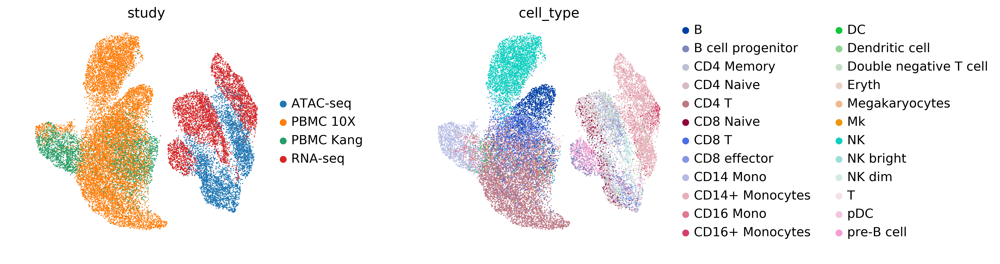

In [25]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.5, frameon=False, save=None)

latent 

In [26]:
latent_adata = network.to_latent(adata_for_training, encoder_datasets)
latent_adata

AnnData object with n_obs × n_vars = 25024 × 10 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [27]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

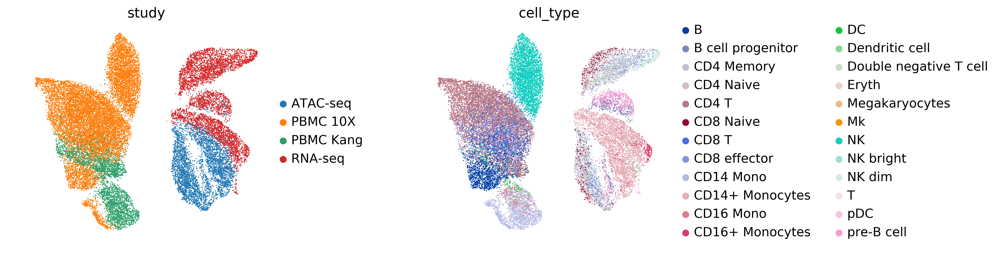

In [28]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.5, frameon=False, save=None)

## Training

In [29]:
new_network = surgeon.operate(network, 
                              new_conditions=target_datasets,
                              remove_dropout=True,
                              init='zeros', 
                              freeze=True,
                              freeze_expression_input=True)

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
data (InputLayer)               (None, 3000)         0                                            
__________________________________________________________________________________________________
encoder_labels (InputLayer)     (None, 5)            0                                            
__________________________________________________________________________________________________
first_layer (FirstLayer)        (None, 128)          384640      data[0][0]                       
                                                                 encoder_labels[0][0]             
__________________________________________________________________________________________________
batch_normalization_11 (BatchNo (None, 128)          512         first_layer[0][0]                
__________

In [30]:
new_network.model_path = f"./models/CVAE/run/pbmc_atac/after/"

In [31]:
new_network.condition_encoder

{'PBMC Kang': 0, 'PBMC 10X': 1, 'RNA-seq': 2, 'ATAC-seq': 3, 'PBMC 68K': 4}

In [32]:
adata_out_of_sample.obs[condition_key].value_counts()

PBMC 68K    18006
Name: study, dtype: int64

In [33]:
train_adata, valid_adata = surgeon.utils.train_test_split(adata_out_of_sample, 0.95)

In [34]:
train_adata.shape, valid_adata.shape

((17105, 3000), (901, 3000))

In [35]:
new_network.train(train_adata,
                  valid_adata,
                  condition_key=condition_key,
                  le=new_network.condition_encoder,
                  n_epochs=500,
                  batch_size=1024,
                  early_stop_limit=300,
                  lr_reducer=300,
                  n_per_epoch=0,
                  save=True,
                  retrain=True,
                  verbose=1)

Train on 17105 samples, validate on 901 samples
Epoch 1/500
17105/17105 [==============================] - 4s 229us/step - loss: 992.1854 - reconstruction_loss: 992.1837 - mmd_loss: 0.0000e+00 - val_loss: 1454.2640 - val_reconstruction_loss: 1454.2621 - val_mmd_loss: 0.0000e+00
Epoch 2/500
17105/17105 [==============================] - 0s 22us/step - loss: 992.0011 - reconstruction_loss: 991.9994 - mmd_loss: 0.0000e+00 - val_loss: 1453.8077 - val_reconstruction_loss: 1453.8058 - val_mmd_loss: 0.0000e+00
Epoch 3/500
17105/17105 [==============================] - 0s 22us/step - loss: 991.8821 - reconstruction_loss: 991.8803 - mmd_loss: 0.0000e+00 - val_loss: 1453.9617 - val_reconstruction_loss: 1453.9597 - val_mmd_loss: 0.0000e+00
Epoch 4/500
17105/17105 [==============================] - 0s 22us/step - loss: 990.5172 - reconstruction_loss: 990.5154 - mmd_loss: 0.0000e+00 - val_loss: 1454.0902 - val_reconstruction_loss: 1454.0883 - val_mmd_loss: 0.0000e+00
Epoch 5/500
17105/17105 [======

In [36]:
new_network.condition_encoder

{'PBMC Kang': 0, 'PBMC 10X': 1, 'RNA-seq': 2, 'ATAC-seq': 3, 'PBMC 68K': 4}

In [37]:
encoder_datasets, _ = surgeon.utils.label_encoder(adata_out_of_sample, label_encoder=new_network.condition_encoder,
                                                        condition_key=condition_key)
encoder_datasets.shape

(18006, 1)

MMD surgery 

In [38]:
latent_adata = new_network.to_mmd_layer(adata_out_of_sample, encoder_datasets, encoder_datasets)
latent_adata

AnnData object with n_obs × n_vars = 18006 × 10 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [39]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

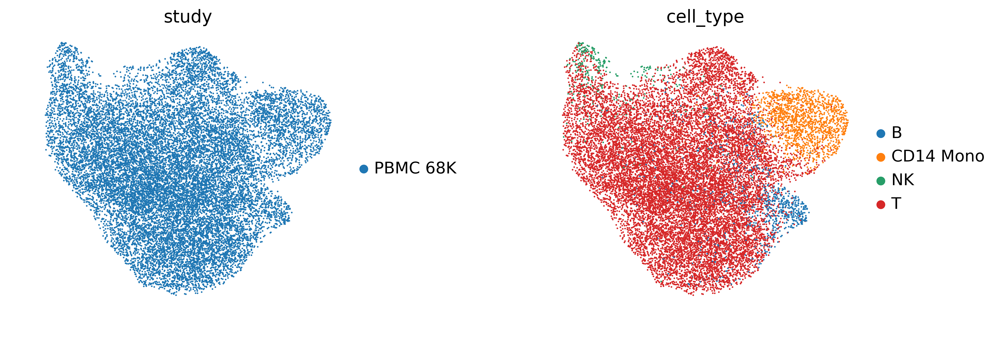

In [40]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.5, frameon=False, save=None)

latent surgery

In [41]:
latent_adata = new_network.to_latent(adata_out_of_sample, encoder_datasets)
latent_adata

AnnData object with n_obs × n_vars = 18006 × 10 
    obs: 'batch', 'cell_type', 'condition', 'domain', 'nCount_RNA', 'nFeature_RNA', 'n_counts', 'orig.ident', 'seurat_annotations', 'stim', 'study'

In [42]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

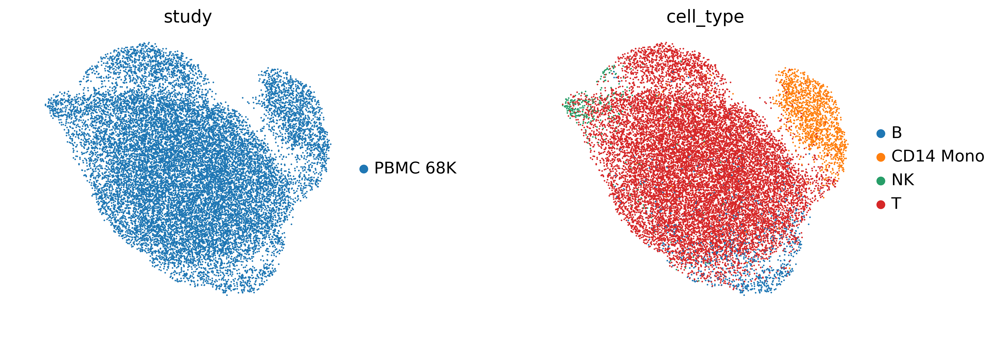

In [43]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.5, frameon=False, save=None)

In [44]:
encoder_datasets, _ = surgeon.utils.label_encoder(adata, label_encoder=new_network.condition_encoder,
                                                        condition_key=condition_key)
encoder_datasets.shape

(68054, 1)

MMD

In [45]:
latent_adata = new_network.to_mmd_layer(adata, encoder_datasets, encoder_datasets)

In [46]:
sc.pp.subsample(latent_adata, fraction=.2)

In [47]:
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

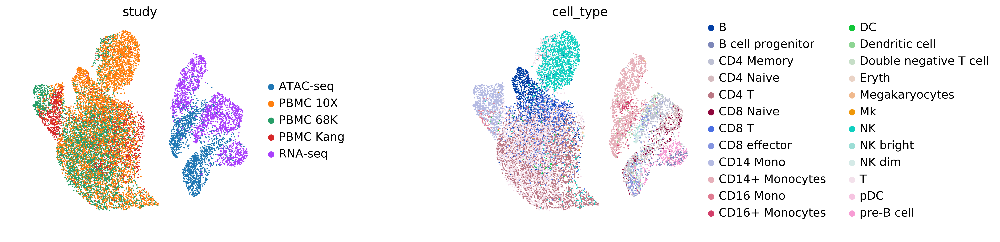

In [48]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.7, frameon=False, save=None)

latent 

In [49]:
latent_adata = new_network.to_latent(adata, encoder_datasets)
sc.pp.neighbors(latent_adata)
sc.tl.umap(latent_adata)

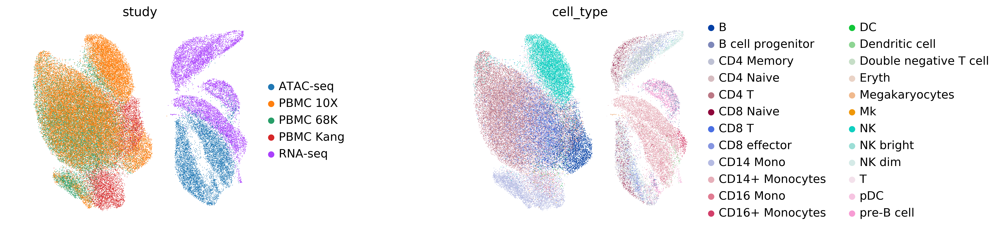

In [50]:
sc.pl.umap(latent_adata, color=[condition_key, cell_type_key], 
           wspace=0.7, frameon=False, save=None)